In [4]:
import os
import re
import math
import tifffile
import cv2

import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from scipy.stats import scoreatpercentile
import ImageParser as IP
from apeer_ometiff_library import io
from pathlib import Path

In [5]:
# path_images_raw = './data/IMC_ESD/2.ROIs_raw/'
path_images_raw = '/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw'
fovs = os.listdir(path_images_raw)
print(fovs)

['ESD4_02', 'ESD4_03', 'ESD1_05', 'ESD2_05', 'ESD8_05', 'ESD7_03', 'ESD7_08', 'ESD1_02', 'ESD7_04', 'ESD6_03', 'ESD4_05', 'ESD7_07', 'ESD2_03', 'ESD3_08', 'ESD3_06', 'ESD3_07', 'ESD8_04', 'ESD7_06', 'ESD1_03', 'ESD5_05', 'ESD8_03', 'ESD5_03', 'ESD6_07', 'ESD4_01', 'ESD2_02', 'ESD6_04', 'ESD6_02', 'ESD5_02', 'ESD3_03', 'ESD2_06', 'ESD2_01', 'ESD4_04', 'ESD8_09', 'ESD1_04', 'ESD7_09', 'ESD3_05', 'ESD1_08', 'ESD3_01', 'ESD8_01', 'ESD7_05', 'ESD8_07', 'ESD6_08', 'ESD8_08', 'ESD5_01', 'ESD5_04', 'ESD3_02', 'ESD3_04', 'ESD6_09', 'ESD5_06', 'ESD6_06', 'ESD7_01', 'ESD6_05', 'ESD8_06', 'ESD2_04', 'ESD1_09', 'ESD7_02', 'ESD1_01', 'ESD8_02', 'ESD6_01', 'ESD1_06', 'ESD1_07']


In [116]:
channels = ['CD20', 'Vimentin', 'PD-L1', 'CD31', 'CD163', 'VISTA', 'Ki-67', 'DNA2', 'IDO',
            'FOXP3', 'CD68', 'CD57', 'CD14', 'D2-40', 'CD56', 'CD45RO', 'DNA1', 'CD11c', 'CD7',
            'HLA-DR', 'CD204', 'CD8a', 'P16Ink4a', 'CD3', 'Granzyme B', 'Bcatenin',
            'Caspase', 'CD4', 'CD103', 'TGFbeta', 'PD-1', 'CD45', 'LAG-3', 
            'ICOS', 'CD11b', 'Keratin', 'TCRgd', 'CD15', 'TIM-3', 'CD38', 'Tbet', 'CD39']
channel_to_index = {name: index for index, name in enumerate(channels)}


def get_files_from_dir(fov):
    fov_folder = os.path.join(path_images_raw, fov)
    fov_files = os.listdir(fov_folder)
    fov_files = [filename for filename in fov_files if filename.lower().endswith((".tiff", ".tif"))]
    fov_files = [os.path.join(fov_folder, file) for file in fov_files]
    return fov_files

def get_stack(fov_files):
    # get a stack of images
    stack = []
    for channel in channels:   
        file = [filename for filename in fov_files if channel in filename][0]
        img_apeer, _ = io.read_ometiff(file)
        img = img_apeer.squeeze()
        stack.append(np.array(img))
    stack = np.stack(stack, axis = -1)
    return stack

def plot_comparison(image1, image2, channel_to_compare):

    plt.figure(figsize=(10, 5), dpi = 500)
    plt.subplot(1, 2, 1)
    plt.imshow(image1, cmap='gray') #,vmin = 0, vmax = 1
    plt.title(channel_to_compare)

    plt.subplot(1, 2, 2)
    plt.imshow(image2, cmap = 'gray') # , vmin = 0, vmax = 1
    plt.title(channel_to_compare)

    plt.show()

def save_stack(img, output_dir):
    if not os.path.exists(output_dir): 
        os.makedirs(output_dir) 
    for i in range(img.shape[2]):
        slice = img[:,:,i]
        channel = channels[i]
#         # Create a Matplotlib figure and axis
#         plt.figure()
#         plt.imshow(slice, cmap='gray')  # Use 'gray' colormap for grayscale images
#         plt.axis('off')  # Hide axes

        # Generate a filename for the image (e.g., "image_0.png", "image_1.png", ...)
        filename = os.path.join(output_dir, f"{channel}.tiff") # .png

        # Save the image
#         plt.savefig(filename, bbox_inches='tight', pad_inches=0, dpi = 700)
        tifffile.imwrite(filename,np.float32(slice),
                 photometric="minisblack")
        # Close the Matplotlib figure to release resources
        plt.close()
        
        
# functions for neigbooring and counting pixels analysis
def get_counts_neigh(image):
    # Threshold the image to get binary values
    binary_image = (image > 0).astype(np.uint8)
    positive_pixel_count = np.count_nonzero(binary_image)
#     print(positive_pixel_count)
    # Find the coordinates of positive (non-zero) pixels in the binary image
    positive_pixel_coords = np.argwhere(binary_image == 1)

    # Initialize lists to store results
    positive_counts = []
    medians = []
    percentile_25 = []
    percentile_75 = []
    # Iterate through positive pixels
    for coord in positive_pixel_coords:
        y, x = coord[0], coord[1]
        
        # Extract the 3x3 window around the current positive pixel
        # Define the coordinates for the 3x3 window
        y_start, y_end = max(y - 1, 0), min(y + 2, binary_image.shape[0])
        x_start, x_end = max(x - 1, 0), min(x + 2, binary_image.shape[1])

        # Extract the 3x3 window around the current positive pixel
        window = binary_image[y_start:y_end, x_start:x_end]
            
        # Count positive pixels in the 3x3 window
        positive_count = np.count_nonzero(window)
        positive_counts.append(positive_count)

        # Calculate the median and percentiles
        
        window = image[y_start:y_end, x_start:x_end]
        median = np.median(window)
        p_25 = scoreatpercentile(window, 25)
        p_75 = scoreatpercentile(window, 75)

        # Append the statistics to the respective lists
        medians.append(median)
        percentile_25.append(p_25)
        percentile_75.append(p_75)
    return positive_counts, medians, percentile_25, percentile_75


def plot_hist_positive_neig(positive_counts1,positive_counts2):
    # Create a figure with two subplots (side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Plot the first histogram on the left subplot
    axes[0].hist(positive_counts1, bins=range(max(positive_counts1) + 2), rwidth=0.8, align='left')
    axes[0].set_xlabel('Number of neighboring Positive Pixels of positive pixels')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title('Histogram 1')

    # Plot the second histogram on the right subplot
    axes[1].hist(positive_counts2, bins=range(max(positive_counts2) + 2), rwidth=0.8, align='left')
    axes[1].set_xlabel('Number of neighboring Positive Pixels of positive pixels')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title('Histogram 2')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

def plot_percentiles(list1,list2):
    # Create two separate figures for the first and second graphs
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plot the distribution of medians and percentiles for the first graph
    ax1.hist(list1, bins=10, color=['blue', 'green', 'red'], alpha=0.7, label=['Median', 'Percentile 25', 'Percentile 75'])
    ax1.set_xlabel('Values')
    ax1.set_ylabel('Frequency')
    ax1.set_title('Distribution of Medians and Percentiles ()')
    ax1.legend()
    # Plot the distribution of medians and percentiles for the first graph
    ax2.hist(list2, bins=10, color=['blue', 'green', 'red'], alpha=0.7, label=['Median', 'Percentile 25', 'Percentile 75'])
    ax2.set_xlabel('Values')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Distribution of Medians and Percentiles ()')
    ax1.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()
    

In [49]:
fov = 'ESD1_01/'
fov_files = get_files_from_dir(fov)
stack = get_stack(fov_files)
print(stack.shape)

# apply percentile
img_out = IP.remove_outliers(stack, up_limit=99, down_limit=1)
# normalize
img_norm = IP.normalize_by_channel(img_out)

(1000, 1000, 42)


# Bodenmiller filter

In [8]:
def filter_hot_pixelsBodenmiller(img: np.ndarray, thres: float) -> np.ndarray:
    '''

    :param img:
    :param thres:
    :return:
    # https://github.com/BodenmillerGroup/ImcSegmentationPipeline/blob/56ce18cfa570770eba169c7a3fb02ac492cc6d4b/src/imcsegpipe/utils.py#L10

    '''
    from scipy.ndimage import maximum_filter
    kernel = np.ones((1, 3, 3), dtype=bool)
    kernel[0, 1, 1] = False
    # array([[[ True,  True,  True],
    #         [ True, False,  True],
    #         [ True,  True,  True]]])
    max_neighbor_img = maximum_filter(img, footprint=kernel, mode="mirror")
    return np.where(img - max_neighbor_img > thres, max_neighbor_img, img)

def modified_hot_pixelsBodenmiller(img: np.ndarray, thres: float, window_size: int = 3) -> np.ndarray:
    """

    :param img:
    :param thres:
    :param window_size:
    :return:
    """
    # changed for channels last and accept window
    # https://bodenmillergroup.github.io/steinbock/latest/cli/preprocessing/
    # https://github.com/BodenmillerGroup/ImcSegmentationPipeline/blob/56ce18cfa570770eba169c7a3fb02ac492cc6d4b/src/imcsegpipe/utils.py#L10
    from scipy.ndimage import maximum_filter
    kernel = np.ones((window_size, window_size, 1), dtype=bool)
    line = window_size // 2
    kernel[line, line, 0] = False  # cneter pixel
    max_neighbor_img = maximum_filter(img, footprint=kernel, mode="mirror")
    return np.where(img - max_neighbor_img > thres, max_neighbor_img, 0)  # img


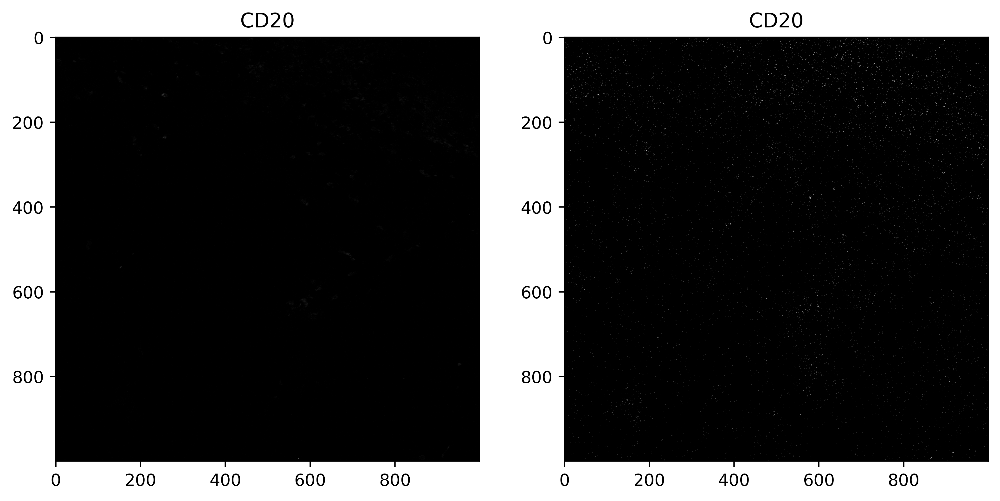

In [114]:
img_fil = modified_hot_pixelsBodenmiller(img_norm, thres = 0.2)
channel_to_compare = 'CD20'
index = channel_to_index.get(channel_to_compare, -1)

plot_comparison(stack[:,:,index], img_fil[:,:,index], channel_to_compare)

In [115]:
output_dir='/home/martinha/PycharmProjects/phd/Preprocess_IMC/comparison/img_results/IMC_specific/Bodennorm02'
save_stack(img_fil, output_dir)

# IMC denoise

# We will try the IMC denoise package from *
We will follow the instructions provided by theauthors in the Jupyter notebook.
https://github.com/PENGLU-WashU/IMC_Denoise/blob/main/Jupyter_Notebook_examples/IMC_Denoise_Train_and_Predict.ipynb
*Lu, Peng, et al. "IMC-Denoise: a content aware denoising pipeline to enhance Imaging Mass Cytometry." Nature communications 14.1 (2023): 1601.

In [45]:
%load_ext autoreload
%autoreload
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DIMR import DIMR
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DeepSNiF import DeepSNiF
from IMC_Denoise_package.IMC_Denoise.DeepSNiF_utils.DeepSNiF_DataGenerator import DeepSNiF_DataGenerator

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


2023-11-02 12:58:12.679949: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-11-02 12:58:12.680503: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-11-02 12:58:12.757182: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-11-02 12:58:12.757313: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.545GHz coreCount: 68 deviceMemorySize: 10.75GiB deviceMemoryBandwidth: 573.69GiB/s
2023-11-02 12:58:12.757361: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

# CD20

In [107]:
channel_name = "142Nd_CD20"
Raw_directory = "/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw" 

n_neighbours = 4 # Larger n enables removing more consecutive hot pixels. 
n_iter = 3 # Iteration number for DIMR
window_size = 3 # Slide window size. For IMC images, window_size = 3 is fine.

DataGenerator = DeepSNiF_DataGenerator(channel_name = channel_name, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
generated_patches = DataGenerator.generate_patches_from_directory(load_directory = Raw_directory)
print('The shape of the generated training set is ' + str(generated_patches.shape) + '.')

Image data loaded from ...

/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD4_02/ESD4_02_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD4_03/ESD4_03_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD1_05/ESD1_05_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD2_05/ESD2_05_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD8_05/ESD8_05_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD7_03/ESD7_03_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD7_08/ESD7_08_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD1_02/ESD1_02_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw/ESD7_04/ESD7_04_142Nd_CD20.ome.tiff
/home/martinha/PycharmProjects/phd/Preprocess

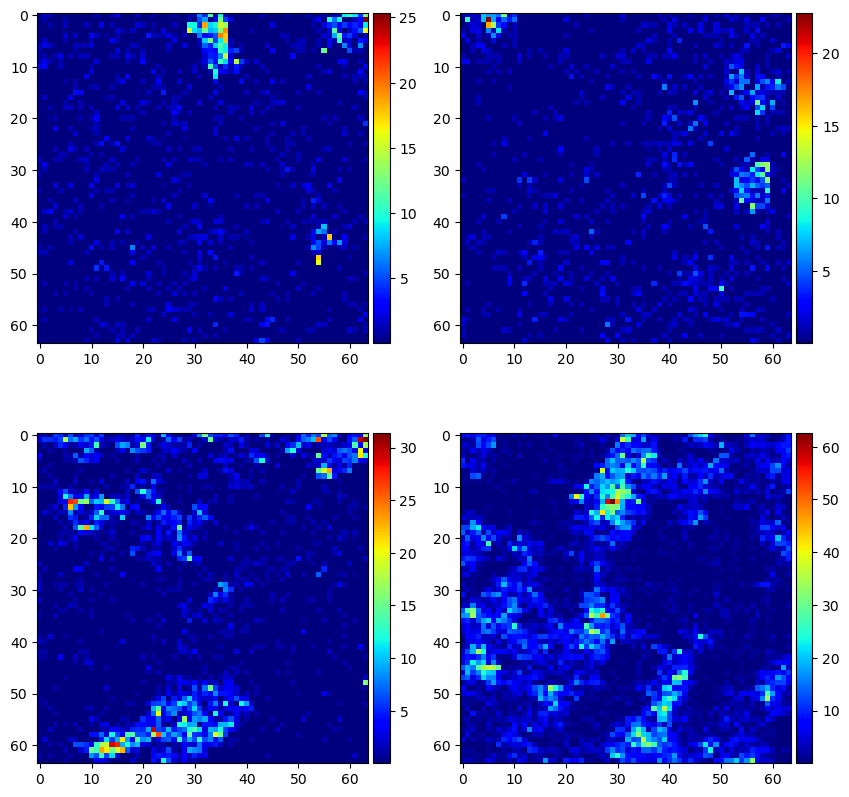

In [56]:
# Show several generated patches of the training set
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig = plt.figure(figsize=(10, 10))

ax1 = fig.add_subplot(221)
im1 = ax1.imshow(generated_patches[0,:,:], cmap = 'jet')
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')

ax2 = fig.add_subplot(222)
im2 = ax2.imshow(generated_patches[100,:,:], cmap = 'jet')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')

ax3 = fig.add_subplot(223)
im3 = ax3.imshow(generated_patches[1000,:,:], cmap = 'jet')
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='vertical')

ax4 = fig.add_subplot(224)
im4 = ax4.imshow(generated_patches[-1,:,:], cmap = 'jet')
divider = make_axes_locatable(ax4)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im4, cax=cax, orientation='vertical')

DeepSNiF configuration and training
Define parameters for DeepSNiF training.

In [108]:
train_epoches = 50 # training epoches, which should be about 200 for a good training result. The default is 200.
train_initial_lr = 1e-3 # inital learning rate. The default is 1e-3.
train_batch_size = 128 # training batch size. For a GPU with smaller memory, it can be tuned smaller. The default is 256.
pixel_mask_percent = 0.2 # percentage of the masked pixels in each patch. The default is 0.2.
val_set_percent = 0.15 # percentage of validation set. The default is 0.15.
loss_function = "I_divergence" # loss function used. The default is "I_divergence".
weights_name = None # trained network weights saved here. If None, the weights will not be saved.
loss_name = None # training and validation losses saved here, either .mat or .npz format. If not defined, the losses will not be saved.
weights_save_directory = None # location where 'weights_name' and 'loss_name' saved.
# If the value is None, the files will be saved in a sub-directory named "trained_weights" of  the current file folder.
is_load_weights = False # Use the trained model directly. Will not read from saved one.
lambda_HF = 3e-6 # HF regularization parameter
deepsnif = DeepSNiF(train_epoches = train_epoches, 
                  train_learning_rate = train_initial_lr,
                  train_batch_size = train_batch_size,
                  mask_perc_pix = pixel_mask_percent,
                  val_perc = val_set_percent,
                  loss_func = loss_function,
                  weights_name = weights_name,
                  loss_name = loss_name,
                  weights_dir = weights_save_directory, 
                  is_load_weights = is_load_weights,
                  lambda_HF = lambda_HF)

start training

In [109]:
train_loss, val_loss = deepsnif.train(generated_patches)

The range value to the corresponding model is 124.0065872192383.
Input Channel Shape => (6656, 64, 64, 1)
Number of Training Examples: 5657
Number of Validation Examples: 999
Each training patch with shape of (64, 64) will mask 8 pixels.
Training model...
Epoch 1/50
45/45 [==============================] - 11s 220ms/step - loss: 0.4957 - val_loss: 0.3188
Epoch 2/50
45/45 [==============================] - 10s 215ms/step - loss: 0.1661 - val_loss: 0.2281
Epoch 3/50
45/45 [==============================] - 10s 216ms/step - loss: 0.0655 - val_loss: 0.1023
Epoch 4/50
45/45 [==============================] - 10s 217ms/step - loss: 0.0325 - val_loss: 0.0496
Epoch 5/50
45/45 [==============================] - 10s 217ms/step - loss: 0.0191 - val_loss: 0.0257
Epoch 6/50
45/45 [==============================] - 10s 218ms/step - loss: 0.0133 - val_loss: 0.0235
Epoch 7/50
45/45 [==============================] - 10s 219ms/step - loss: 0.0103 - val_loss: 0.0158
Epoch 8/50
45/45 [===================

Plot the training and validation losses

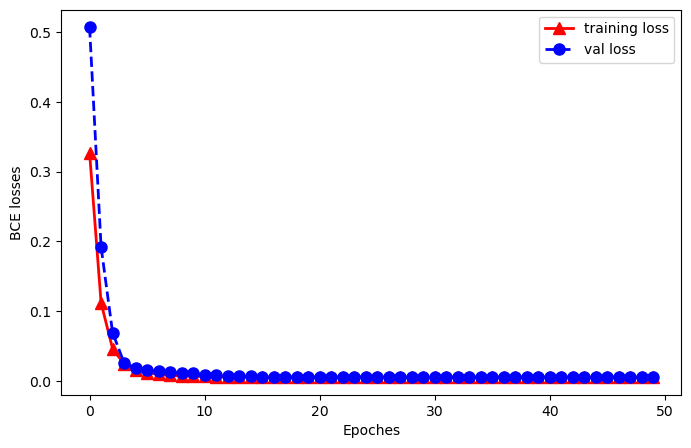

In [57]:
plt.figure(figsize=(8, 5))
plt.plot(np.array(range(len(train_loss))),train_loss, color='red', marker='^', linewidth=2, markersize=8)
plt.plot(np.array(range(len(val_loss))),val_loss, color='blue', marker='o', linestyle='dashed', linewidth=2, markersize=8)
plt.xlabel('Epoches')
plt.ylabel('BCE losses')
plt.legend(['training loss', 'val loss'])
plt.show()

Load a raw CD20 image

In [60]:
fov = 'ESD1_01/'
fov_files = get_files_from_dir(fov)
stack = get_stack(fov_files)
channel_to_compare = 'CD20'
index = channel_to_index.get(channel_to_compare, -1)

Img_raw = stack[:,:,index]


Perform the DIMR algorithm only if the SNR of the raw image is high.

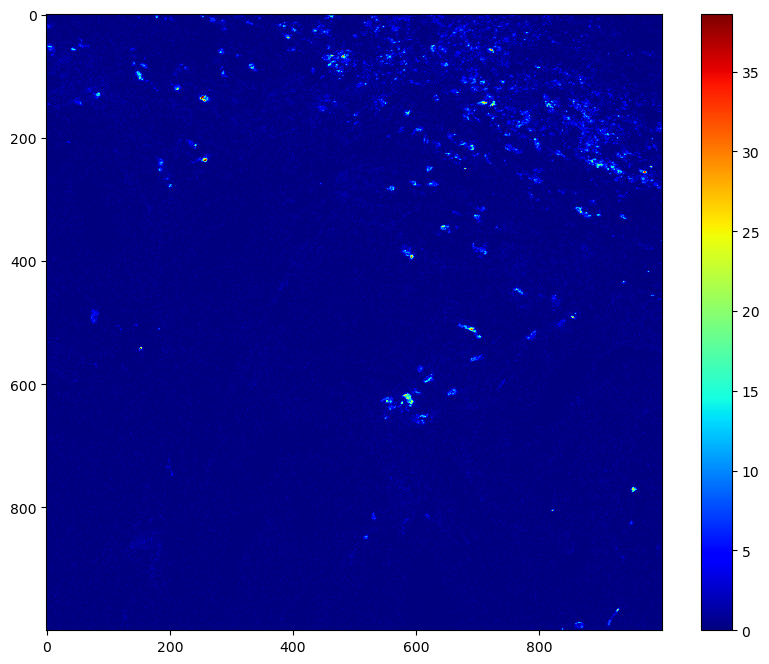

In [61]:
Img_DIMR = DIMR(n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size).perform_DIMR(Img_raw)
plt.figure(figsize = (10,8))
plt.imshow(Img_DIMR, vmin = 0, vmax = 0.5*np.max(Img_DIMR), cmap = 'jet')
plt.colorbar()
plt.show()

If the SNR of the raw image is sub-optimal, perform DIMR and DeepSNiF algorithms for low SNR raw images.

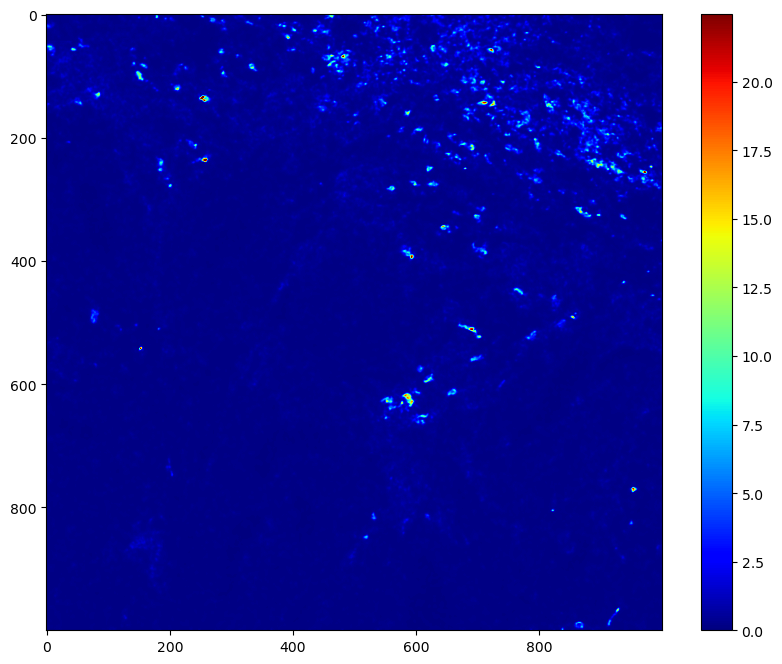

In [62]:
# perform DIMR and DeepSNiF algorithms for low SNR raw images.
Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(Img_raw, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
plt.figure(figsize = (10,8))
plt.imshow(Img_DIMR_DeepSNiF, vmin = 0, vmax = 0.5*np.max(Img_DIMR_DeepSNiF), cmap = 'jet')
plt.colorbar()
plt.show()

In [84]:
def plot_comparison_IMCDenoise(image1, image2,image3, channel_to_compare):

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    # Plot the first image in the first subplot
    im1 = axs[0].imshow(image1, vmin=0, vmax=0.5 * np.max(image1), cmap='jet')
    axs[0].set_title(channel_to_compare + ' RAW')

    im2 = axs[1].imshow(image2, vmin=0, vmax=0.5 * np.max(image1), cmap='jet')
    axs[1].set_title(channel_to_compare + ' DIMR')

    im3 = axs[2].imshow(image3, vmin=0, vmax=0.5 * np.max(image1), cmap='jet')
    axs[2].set_title(channel_to_compare + ' DIMR and DeepSNIF')
    
    cbar1 = fig.colorbar(im1, ax=axs[0])
    cbar2 = fig.colorbar(im2, ax=axs[1])
    cbar3 = fig.colorbar(im3, ax=axs[2])

    plt.tight_layout()
    plt.show()

In [110]:

# for all CD20
channel_name = "142Nd_CD20"
Raw_directory = "/home/martinha/PycharmProjects/phd/Preprocess_IMC/data/IMC_ESD/raw" 
dimr_dir = '/home/martinha/PycharmProjects/phd/Preprocess_IMC/comparison/img_results/IMC_specific/DIMR_cd20'
deepsnif_dir = '/home/martinha/PycharmProjects/phd/Preprocess_IMC/comparison/img_results/IMC_specific/DeppSNIF_cd20'
if not os.path.exists(dimr_dir): 
    os.makedirs(dimr_dir) 
if not os.path.exists(deepsnif_dir): 
    os.makedirs(deepsnif_dir) 

CD20_files = [file for file in Path(Raw_directory).rglob(f'*{channel_name}*')]
CD20_raw = []
CD20_DIMR = []
CD20_DeepSNIF = []
for file in CD20_files:
    filename = Path(file).name
    filename_dimr = os.path.join(dimr_dir, filename)
    filename_deepsnif = os.path.join(deepsnif_dir, filename)
    
    #read_img
    img_apeer, _ = io.read_ometiff(file)
    img = img_apeer.squeeze()
    CD20_raw.append(img)
    
    
    # perform DIMR with the model trained
    dmr = DIMR(n_neighbours = 4, n_iter = 3, window_size = 5)
    img_dimr = dmr.perform_DIMR(img)
    CD20_DIMR.append(img_dimr)
    
    tifffile.imwrite(filename_dimr,np.float32(img_dimr),photometric="minisblack")
    
    
    # DeepSNIF
    Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(img, n_neighbours = n_neighbours, n_iter = n_iter, 
                                                     window_size = window_size)
    CD20_DeepSNIF.append(Img_DIMR_DeepSNiF)
    
    tifffile.imwrite(filename_deepsnif,np.float32(Img_DIMR_DeepSNiF),photometric="minisblack")


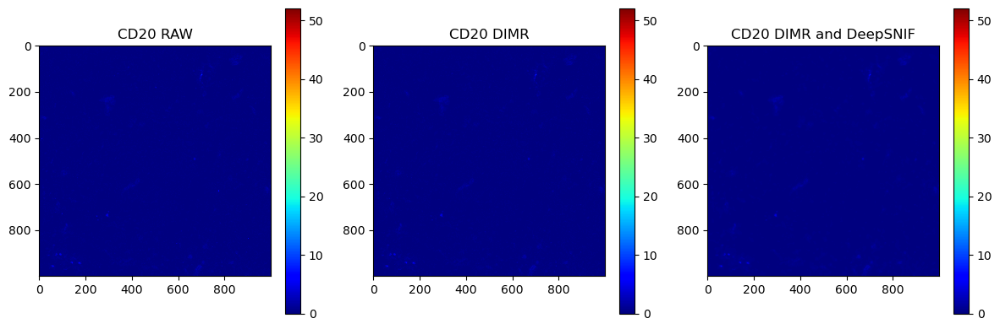

In [85]:
index = 10
plot_comparison_IMCDenoise(CD20_raw[index], CD20_DIMR[index],CD20_DeepSNIF[index],channel_to_compare)


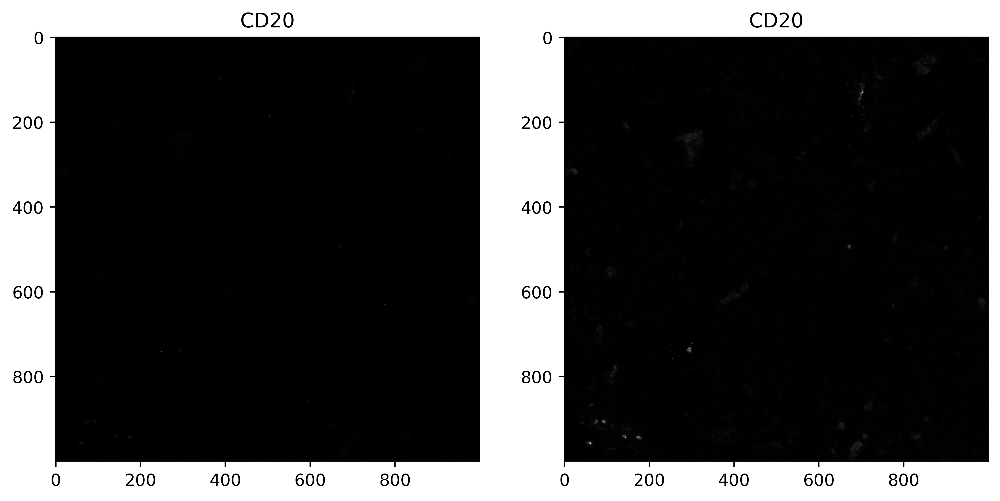

In [111]:
plot_comparison(CD20_raw[index],CD20_DeepSNIF[index],channel_to_compare)

Do all pipeline for other channel 

In [105]:
# # train DEEPSNIF
channel_name = "Bcatenin"

n_neighbours = 4 # Larger n enables removing more consecutive hot pixels. 
n_iter = 3 # Iteration number for DIMR
window_size = 3 # Slide window size. For IMC images, window_size = 3 is fine.

DataGenerator = DeepSNiF_DataGenerator(channel_name = channel_name, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
generated_patches = DataGenerator.generate_patches_from_directory(load_directory = Raw_directory)
print('The shape of the generated training set is ' + str(generated_patches.shape) + '.')


train_epoches = 50 # training epoches, which should be about 200 for a good training result. The default is 200.
train_initial_lr = 1e-3 # inital learning rate. The default is 1e-3.
train_batch_size = 128 # training batch size. For a GPU with smaller memory, it can be tuned smaller. The default is 256.
pixel_mask_percent = 0.2 # percentage of the masked pixels in each patch. The default is 0.2.
val_set_percent = 0.15 # percentage of validation set. The default is 0.15.
loss_function = "I_divergence" # loss function used. The default is "I_divergence".
weights_name = None # trained network weights saved here. If None, the weights will not be saved.
loss_name = None # training and validation losses saved here, either .mat or .npz format. If not defined, the losses will not be saved.
weights_save_directory = None # location where 'weights_name' and 'loss_name' saved.
# If the value is None, the files will be saved in a sub-directory named "trained_weights" of  the current file folder.
is_load_weights = False # Use the trained model directly. Will not read from saved one.
lambda_HF = 3e-6 # HF regularization parameter
deepsnif = DeepSNiF(train_epoches = train_epoches, 
                  train_learning_rate = train_initial_lr,
                  train_batch_size = train_batch_size,
                  mask_perc_pix = pixel_mask_percent,
                  val_perc = val_set_percent,
                  loss_func = loss_function,
                  weights_name = weights_name,
                  loss_name = loss_name,
                  weights_dir = weights_save_directory, 
                  is_load_weights = is_load_weights,
                  lambda_HF = lambda_HF)



train_loss, val_loss = deepsnif.train(generated_patches)

dimr_dir = '/home/martinha/PycharmProjects/phd/Preprocess_IMC/comparison/img_results/IMC_specific/DIMR_bcat'
deepsnif_dir = '/home/martinha/PycharmProjects/phd/Preprocess_IMC/comparison/img_results/IMC_specific/DeepSNIF_bcat'
if not os.path.exists(dimr_dir): 
    os.makedirs(dimr_dir) 
if not os.path.exists(deepsnif_dir): 
    os.makedirs(deepsnif_dir) 

bcat_files = [file for file in Path(Raw_directory).rglob(f'*{channel_name}*')]
bcat_raw = []
bcat_DIMR = []
bcat_DeepSNIF = []
for file in bcat_files:
    filename = Path(file).name
    filename_dimr = os.path.join(dimr_dir, filename)
    filename_deepsnif = os.path.join(deepsnif_dir, filename)
    
    #read_img
    img_apeer, _ = io.read_ometiff(file)
    img = img_apeer.squeeze()
    bcat_raw.append(img)
    
    
    # perform DIMR with the model trained
    dmr = DIMR(n_neighbours = 4, n_iter = 3, window_size = 5)
    img_dimr = dmr.perform_DIMR(img)
    bcat_DIMR.append(img_dimr)
    
    tifffile.imwrite(filename_dimr,np.float32(img_dimr),photometric="minisblack")
    
    
    # DeepSNIF
    Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(img, n_neighbours = n_neighbours, n_iter = n_iter, 
                                                     window_size = window_size)
    bcat_DeepSNIF.append(Img_DIMR_DeepSNiF)
    
    tifffile.imwrite(filename_deepsnif,np.float32(Img_DIMR_DeepSNiF),photometric="minisblack")


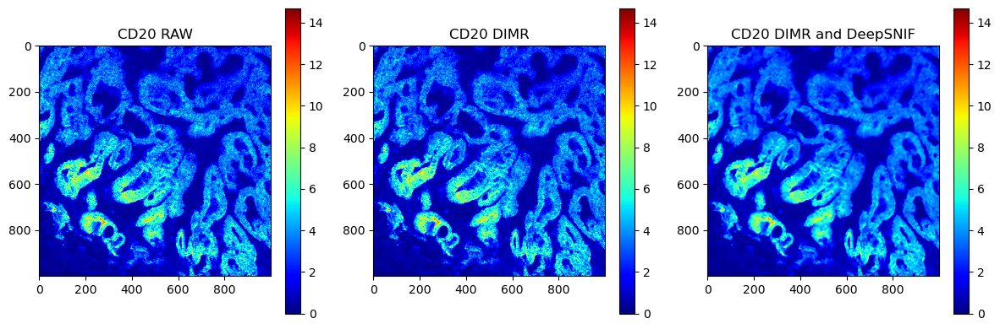

In [87]:
index = 10
plot_comparison_IMCDenoise(bcat_raw[index], bcat_DIMR[index],bcat_DeepSNIF[index],channel_to_compare)

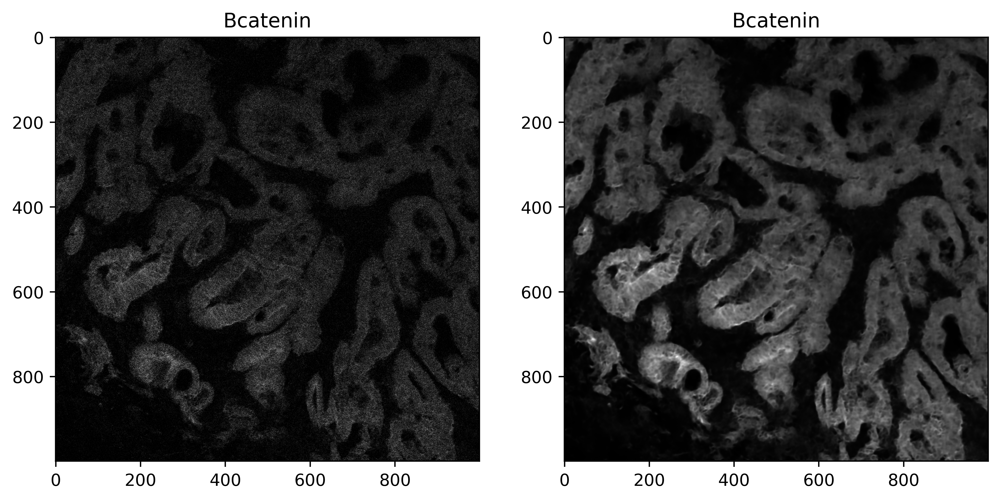

In [113]:
channel_to_compare = "Bcatenin"

plot_comparison(bcat_raw[index],bcat_DeepSNIF[index],channel_to_compare)

# MIBI

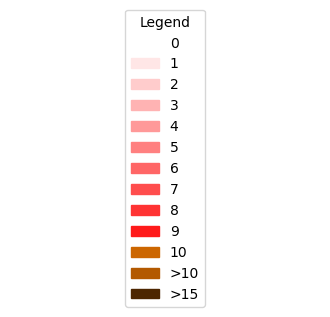

In [99]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap

color_mapping = {
        "0": (255, 255, 255),  # White
        "1": (255, 230, 230),  # Very faded red
        "2": (255, 204, 204),
        "3": (255, 178, 178),
        "4": (255, 153, 153),
        "5": (255, 128, 128),
        "6": (255, 102, 102),
        "7": (255, 77, 77),  # Very strong red
        "8": (255, 51, 51),
        "9": (255, 25, 25),
        "10": (204, 102, 0),  # Light brown
        ">10": (178, 89, 0),  # New color segment for values greater than 10
        ">15": (76, 38, 0)  # New color segment for values greater than 15
    }

# Your color mapping
color_mapping = {
    "0": (1.0, 1.0, 1.0),    # White
    "1": (1.0, 0.9, 0.9),    # Very faded red
    "2": (1.0, 0.8, 0.8),
    "3": (1.0, 0.7, 0.7),
    "4": (1.0, 0.6, 0.6),
    "5": (1.0, 0.5, 0.5),
    "6": (1.0, 0.4, 0.4),
    "7": (1.0, 0.3, 0.3),    # Very strong red
    "8": (1.0, 0.2, 0.2),
    "9": (1.0, 0.1, 0.1),
    "10": (0.8, 0.4, 0.0),   # Light brown
    ">10": (0.7, 0.35, 0.0),   # New color segment for values greater than 10
    ">15": (0.3, 0.15, 0.0)   # New color segment for values greater than 15
}

# Create a legend with color rectangles and text labels
legend_elements = [
    Patch(color=color, label=label) for label, color in color_mapping.items()
]

fig, ax = plt.subplots(figsize=(4, 2))
ax.legend(handles=legend_elements, loc="center", title="Legend")
ax.axis('off')  # Turn off the axis

plt.show()


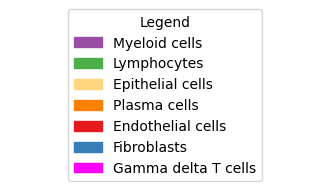

In [100]:
# Your color mapping
color_mapping = {
    "Myeloid cells": '#984ea3',  # purple
    "Lymphocytes": '#4daf4a',    # green
    "Epithelial cells": "#FFD580",  # light yellow
    "Plasma cells": '#ff7f00',    # orange
    "Endothelial cells": '#e41a1c',  # red
    "Fibroblasts": '#377eb8',     # blue
    "Gamma delta T cells": '#FF00FF'
}

# Create a legend with colored labels
legend_elements = [
    Patch(color=color, label=label) for label, color in color_mapping.items()
]

fig, ax = plt.subplots(figsize=(4, 2))
ax.legend(handles=legend_elements, loc="center", title="Legend")
ax.axis('off')  # Turn off the axis

plt.show()

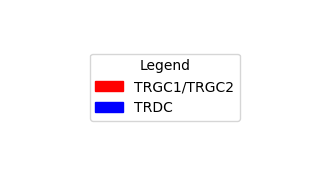

In [101]:
target_colors = {
    'TRGC1/TRGC2': (255, 0, 0),  # Red
    'TRDC': (0, 0, 255)  # Blue
    # value3: (0, 255, 0),  # Green (if you have a third target)
}

# Create a legend with colored labels
legend_elements = [
    Patch(color=[r/255, g/255, b/255], label=label) for label, (r, g, b) in target_colors.items()
]

fig, ax = plt.subplots(figsize=(4, 2))
ax.legend(handles=legend_elements, loc="center", title="Legend")
ax.axis('off')  # Turn off the axis

plt.show()